In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
df_2021=pd.read_csv('/content/DK1_2021.csv')
df_2022=pd.read_csv('/content/DK1_2022.csv')
df_2021

,TotalLoad,year,month,date,hour
0,2042.819946,2021,1,1,0
1,1966.479980,2021,1,1,1
2,1915.500000,2021,1,1,2
3,1892.500000,2021,1,1,3
4,1903.260010,2021,1,1,4
...,...,...,...,...,...
8755,0.000000,2021,12,31,19
8756,0.000000,2021,12,31,20
8757,0.000000,2021,12,31,21
8758,0.000000,2021,12,31,22


In [ ]:
def allote_2021(df_2021):
    df_2021['day'] = ''
    a = ['Friday', 'Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday']
    for i in range(0, 365):
        for j in range(0, 24):
            df_2021.loc[((24 * i) + j), 'day'] = a[i % 7]
    return df_2021


In [ ]:
def allote_2022(df_2022):
    df_2022['day'] = ''
    a = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
    for i in range(0, 365):
        for j in range(0, 24):
            df_2022.loc[((24 * i) + j), 'day'] = a[i % 7]
    return df_2022

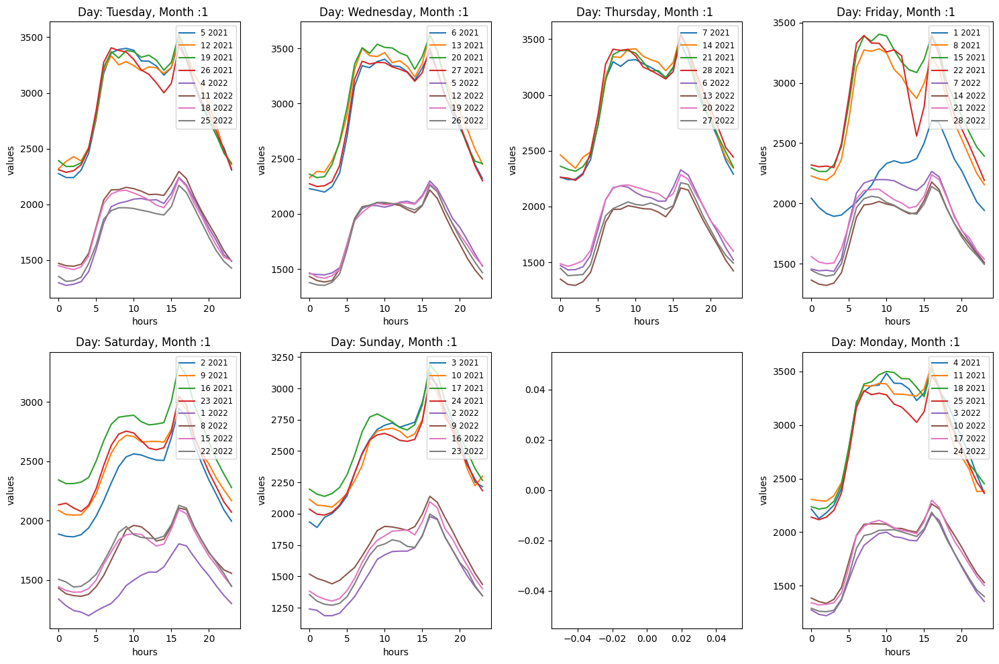

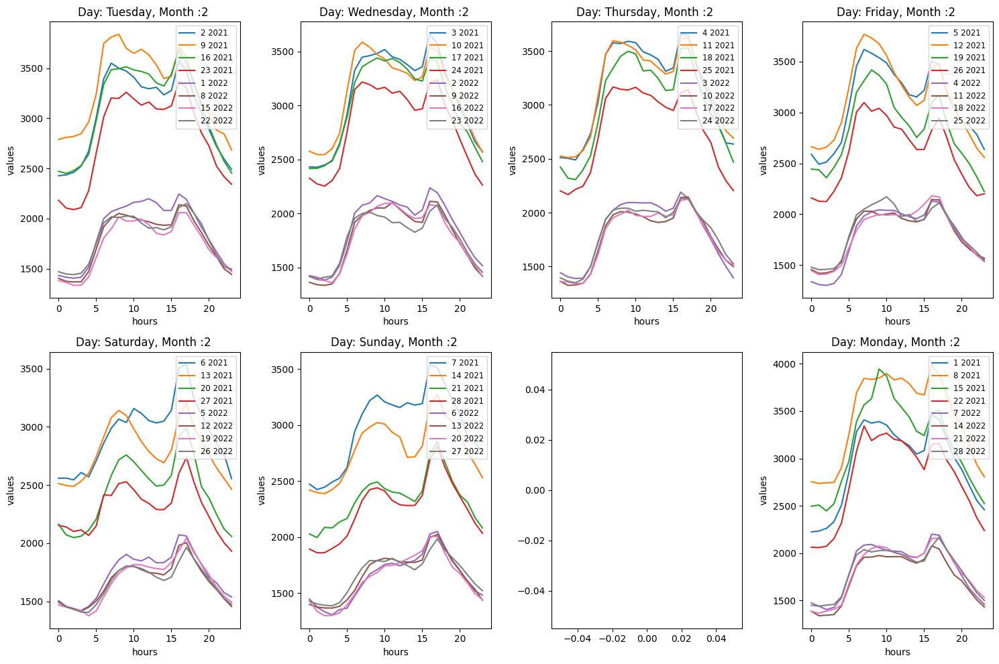

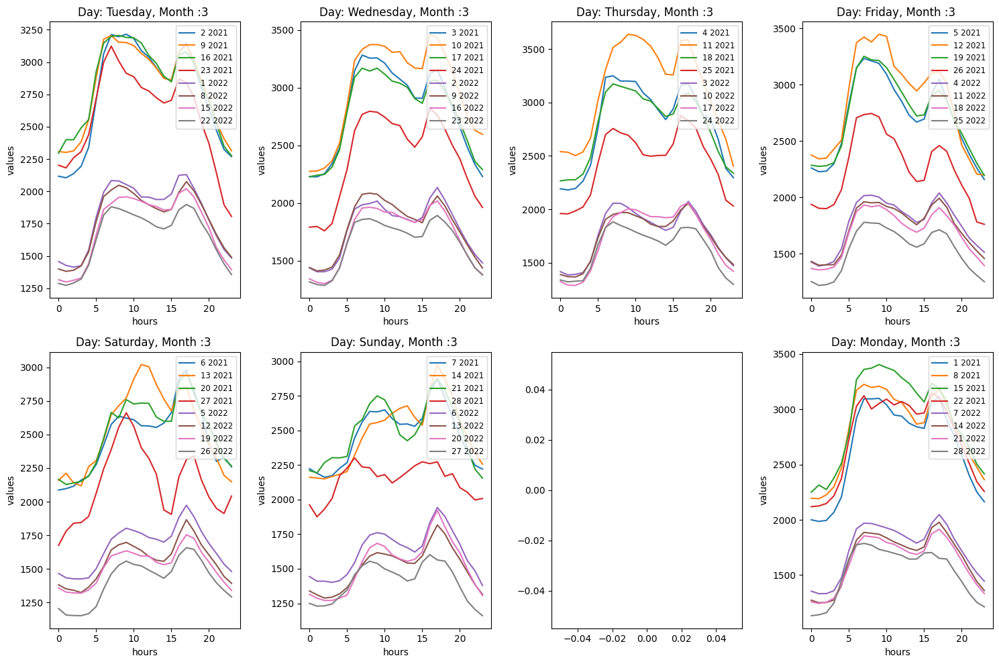

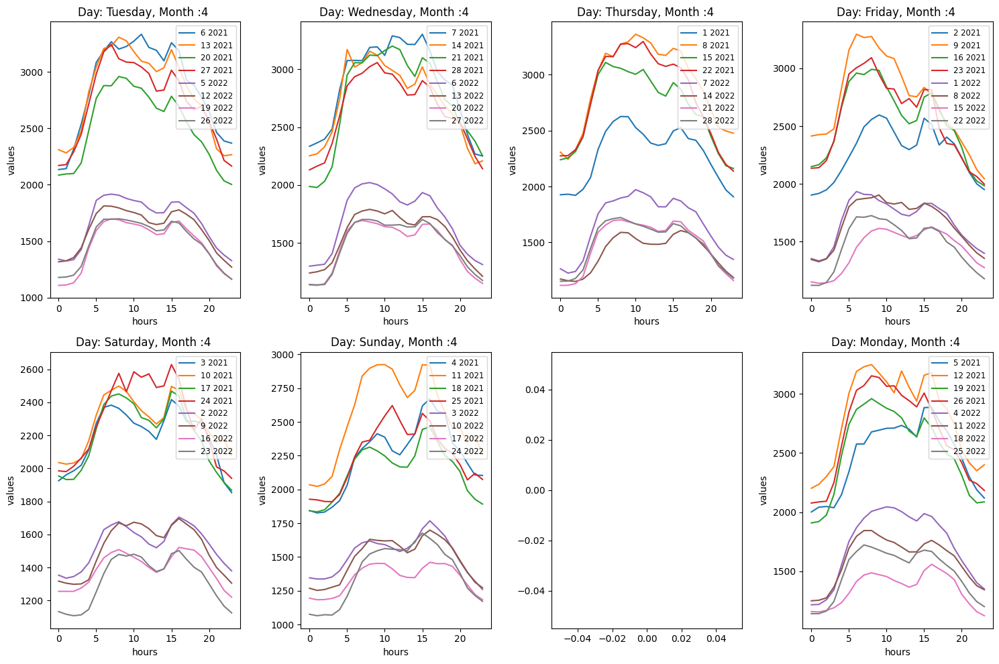

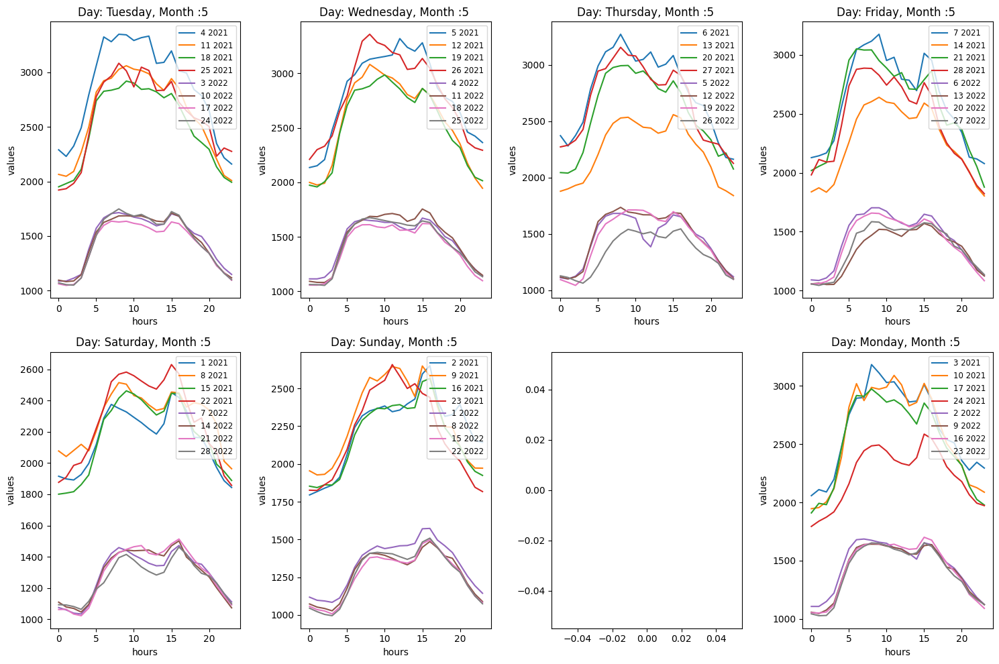

...

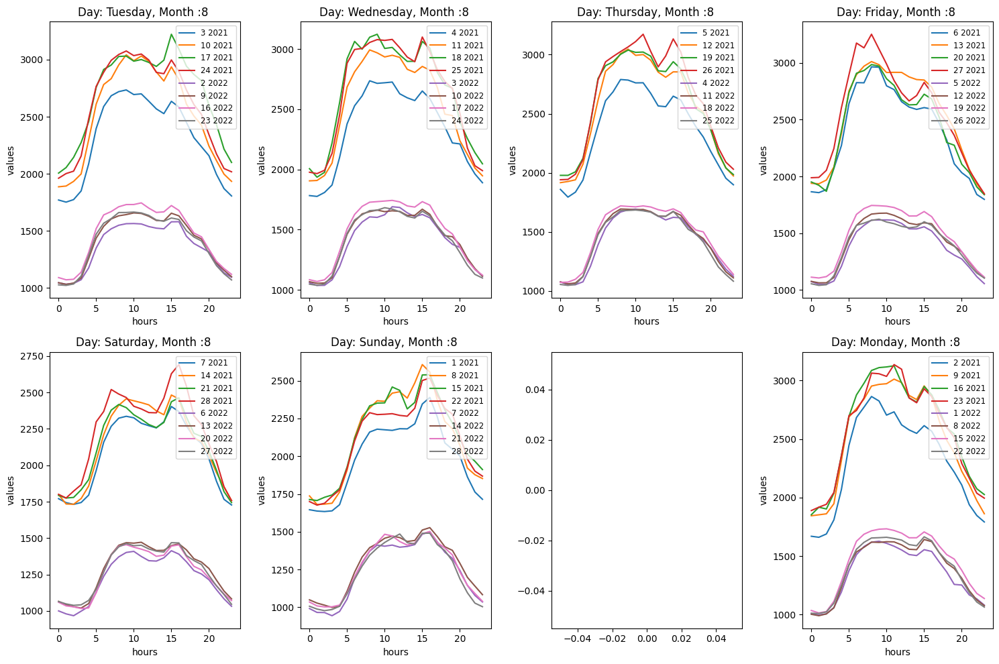

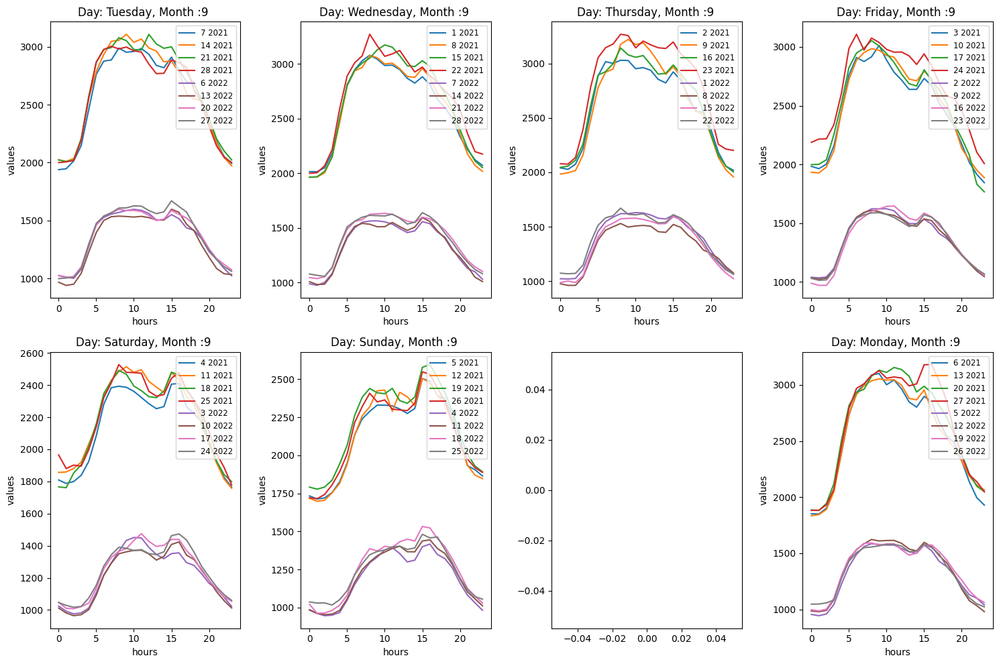

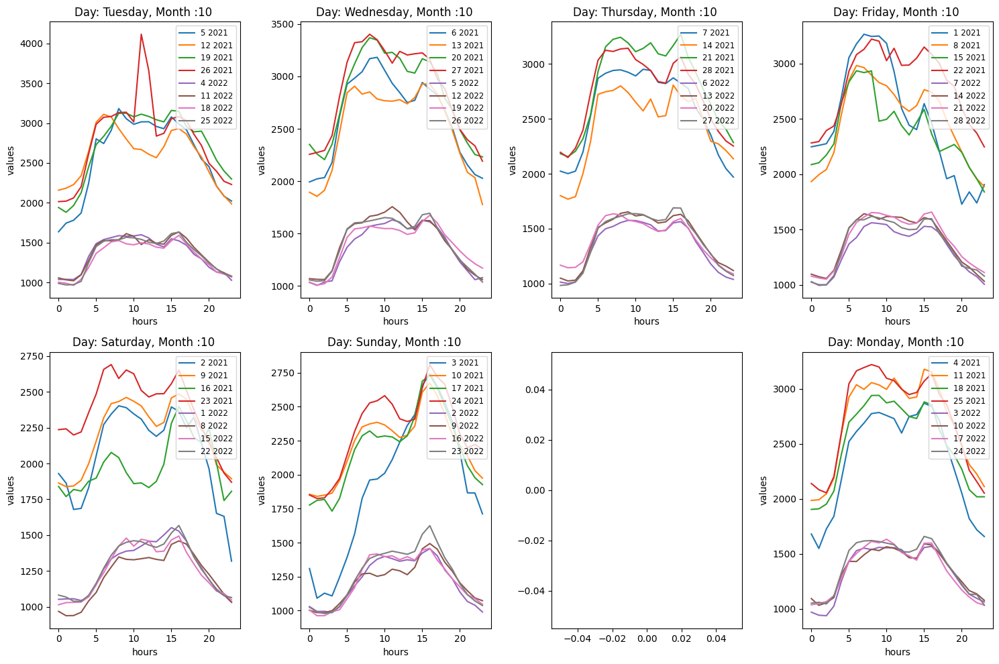

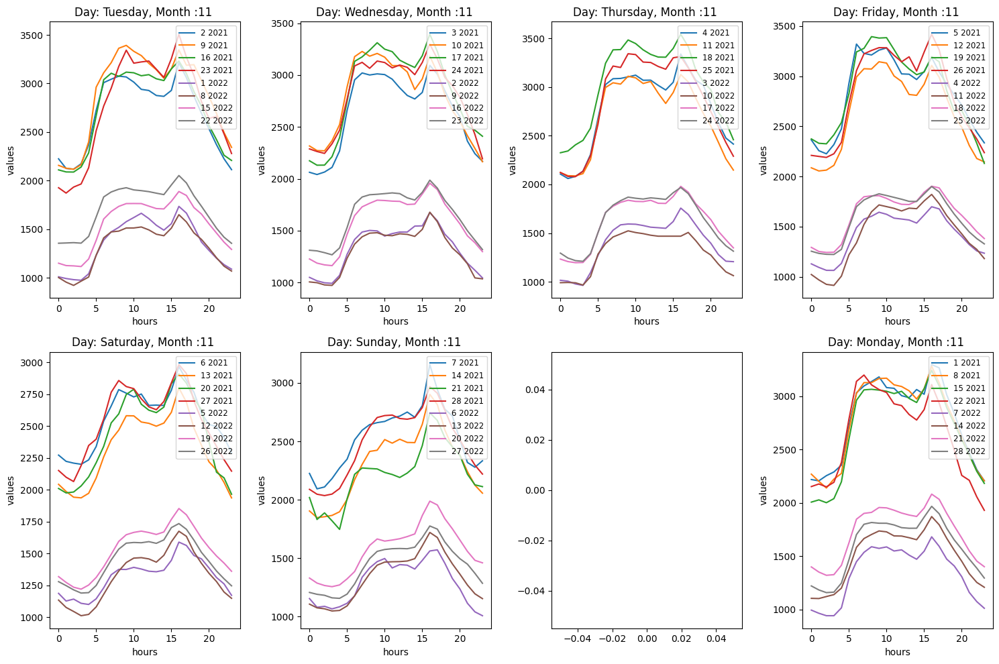

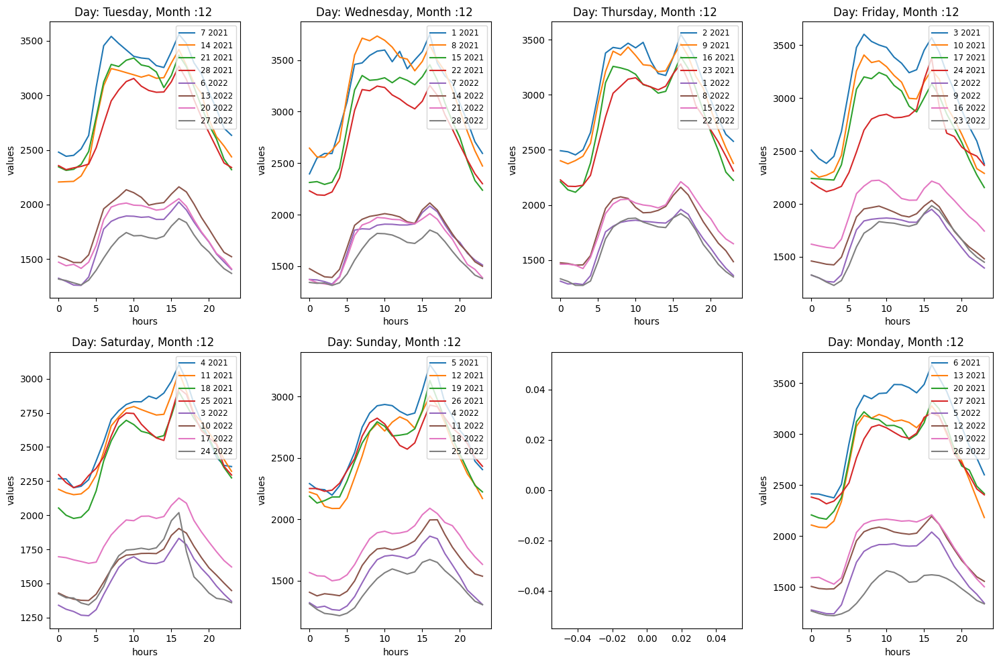

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
def make_graph(df_2022,df_2021,name):
  with PdfPages(f'{name}') as pdf:
      a=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
      for i in range (1,13):
        fig, axs = plt.subplots(2, 4, figsize=(15, 10))
        for j in range (0,7):
          df_temp2 = df_2022[(df_2022['month'] == i) & (df_2022['day'] == a[j])]
          df_temp2 = df_temp2.reset_index(drop=True)
          x_labels=df_temp2['hour'][0:24]
          y_labels5=df_temp2['values'][0:24]
          y_labels6=df_temp2['values'][24:48]
          y_labels7=df_temp2['values'][48:72]
          y_labels8=df_temp2['values'][72:96]
          df_temp1 = df_2021[(df_2021['month'] == i) & (df_2021['day'] == a[j])]
          df_temp1 = df_temp1.reset_index(drop=True)
          y_labels1=df_temp1['values'][0:24]
          y_labels2=df_temp1['values'][24:48]
          y_labels3=df_temp1['values'][48:72]
          y_labels4=df_temp1['values'][72:96]
          plt.plot(x_labels,y_labels1,label=f"{df_temp1.loc[0,'date']} 2021")
          plt.plot(x_labels,y_labels2,label=f"{df_temp1.loc[24,'date']} 2021")
          plt.plot(x_labels,y_labels3,label=f"{df_temp1.loc[48,'date']} 2021")
          plt.plot(x_labels,y_labels4,label=f"{df_temp1.loc[72,'date']} 2021")
          plt.plot(x_labels,y_labels5,label=f"{df_temp2.loc[0,'date']} 2022")
          plt.plot(x_labels,y_labels6,label=f"{df_temp2.loc[24,'date']} 2022")
          plt.plot(x_labels,y_labels7,label=f"{df_temp2.loc[48,'date']} 2022")
          plt.plot(x_labels,y_labels8,label=f"{df_temp2.loc[72,'date']} 2022")
          plt.xlabel('hours')
          plt.ylabel('values')
          plt.title(f"Day: {a[j]}, Month :{df_temp1.loc[0,'month']} ")
          plt.legend(loc='upper right',fontsize='small')
          plt.subplot(2, 4, (j+1))
        plt.tight_layout()
        pdf.savefig()
        plt.plot()
        plt.show()
        plt.close()
df_2021 = allote_2021(df_2021)
df_2022 = allote_2022(df_2022)
df_2021.rename(columns={'TotalLoad': 'values'}, inplace=True)
df_2022.rename(columns={'TotalLoad': 'values'}, inplace=True)
make_graph(df_2022,df_2021,"DK1.pdf")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
df_2021=pd.read_csv('DK2_2021.csv')
df_2022=pd.read_csv('DK2_2022.csv')
df_2021

,TotalLoad,year,month,date,hour
0,1363.040039,2021,1,1,0
1,1309.829956,2021,1,1,1
2,1260.209961,2021,1,1,2
3,1231.280029,2021,1,1,3
4,1234.170044,2021,1,1,4
...,...,...,...,...,...
8755,0.000000,2021,12,31,19
8756,0.000000,2021,12,31,20
8757,0.000000,2021,12,31,21
8758,0.000000,2021,12,31,22


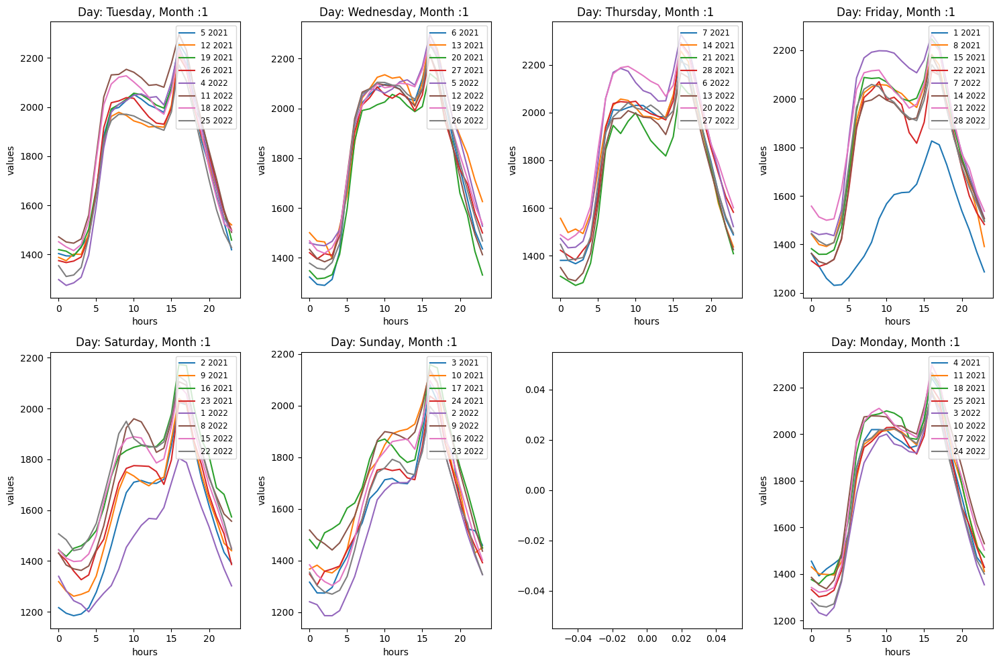

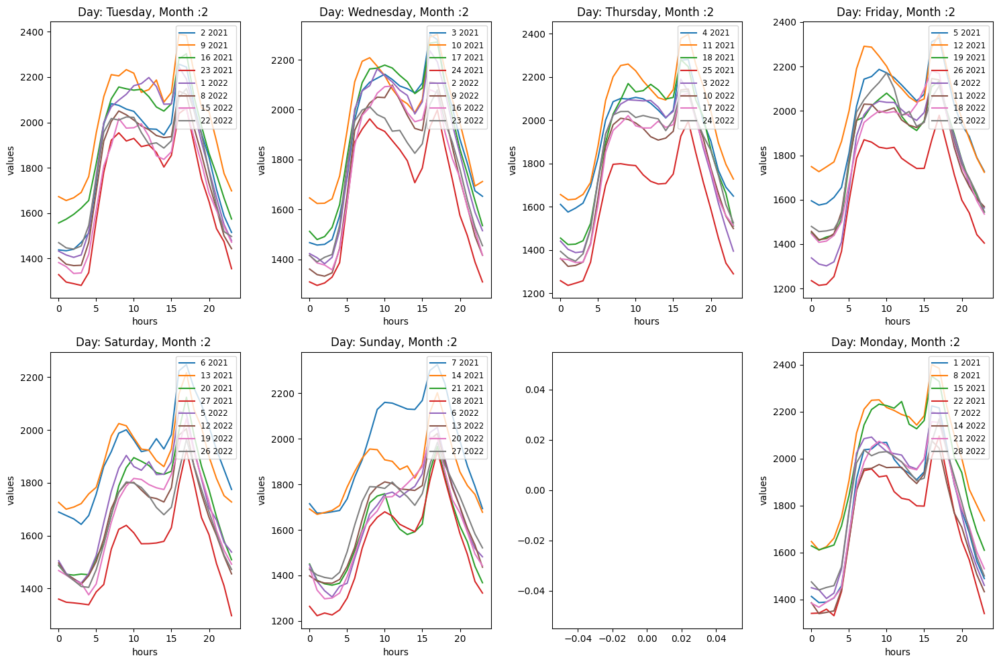

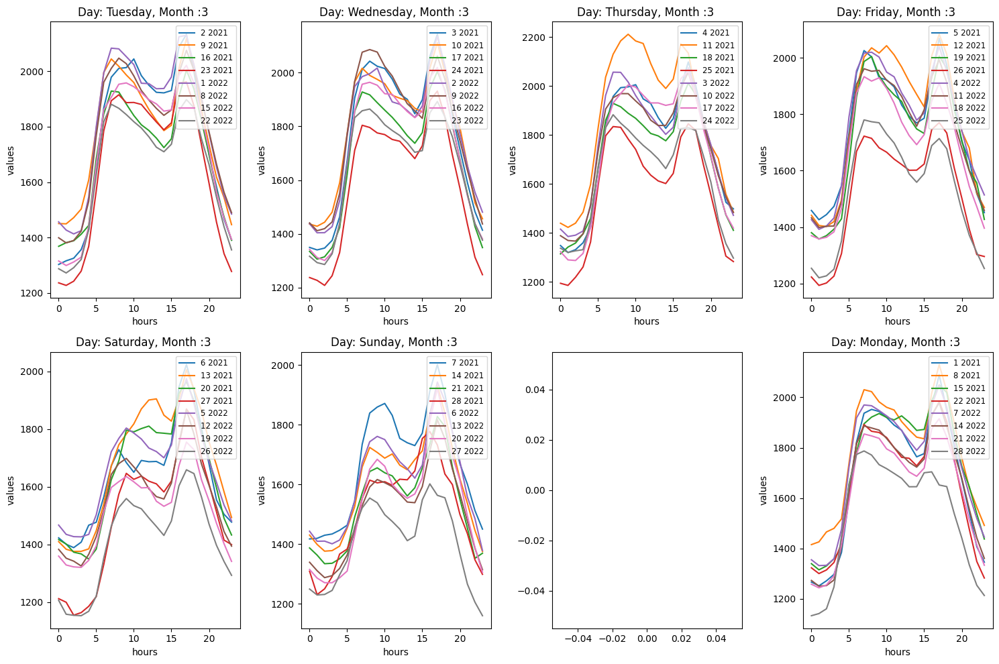

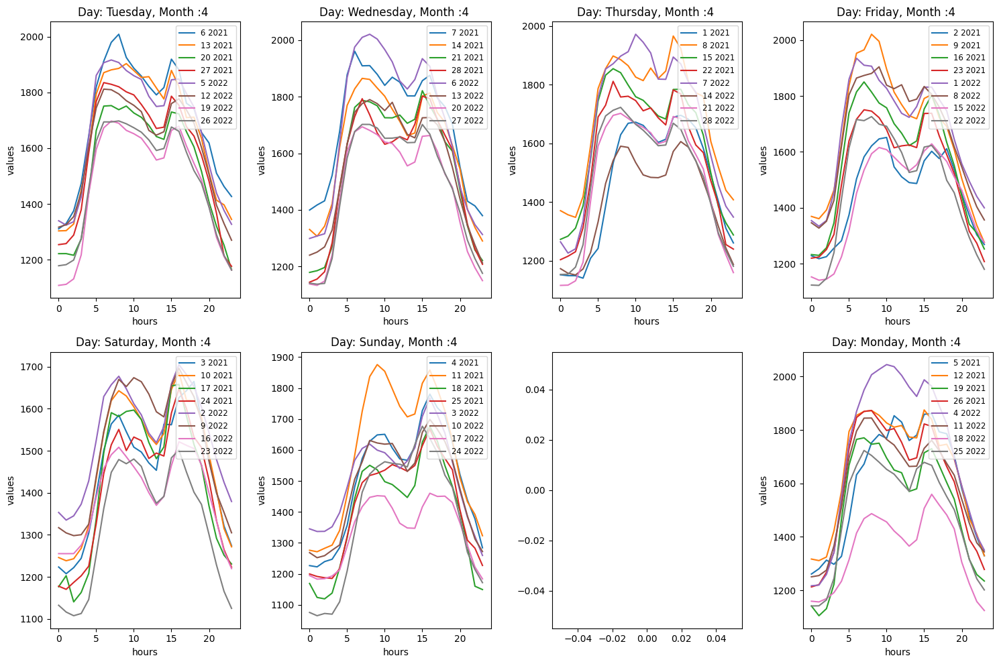

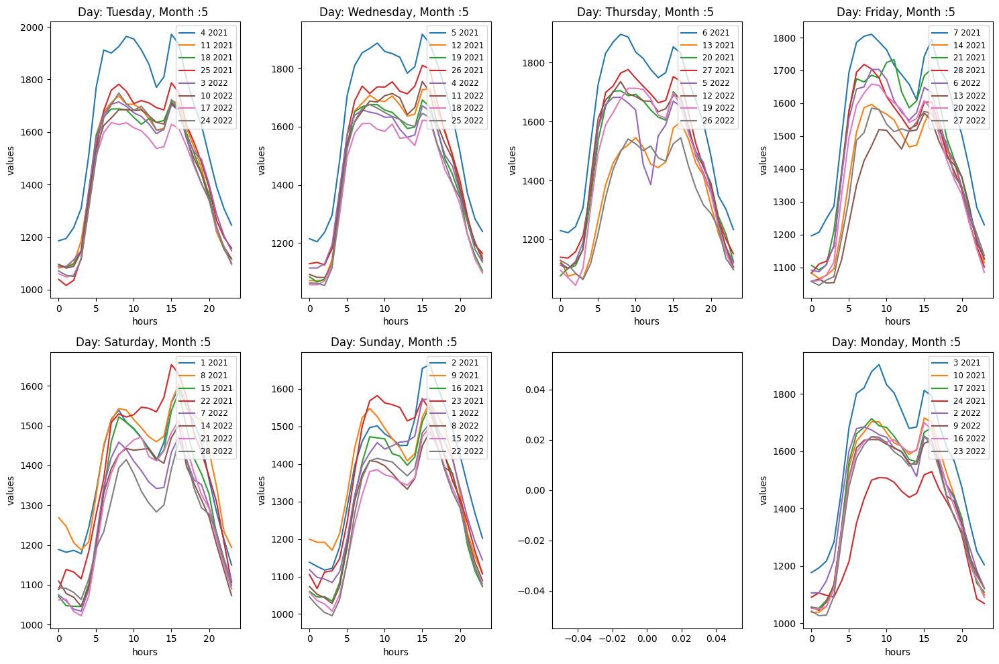

...

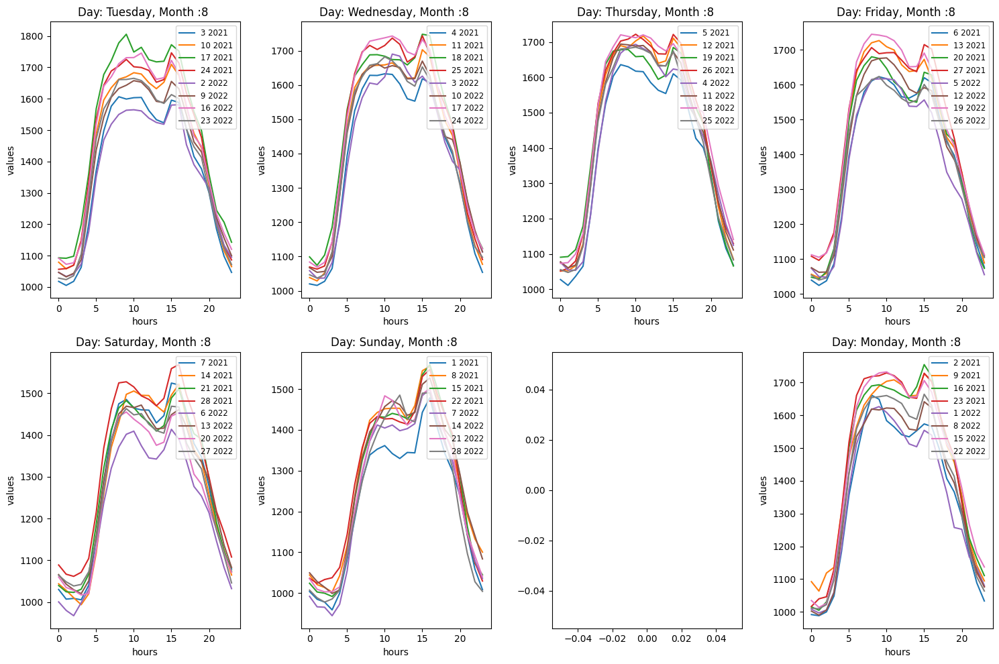

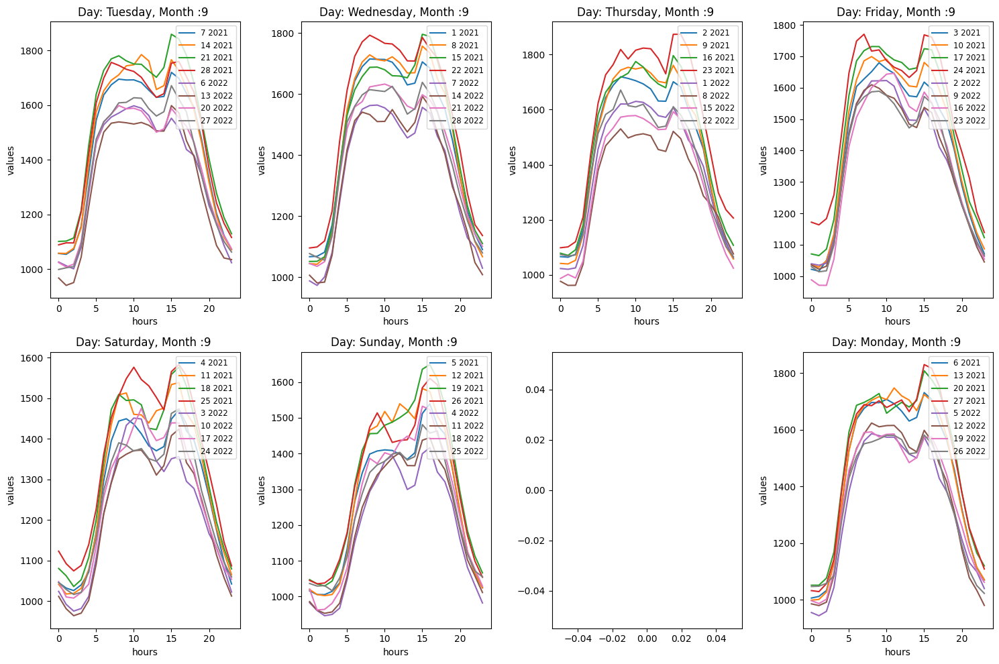

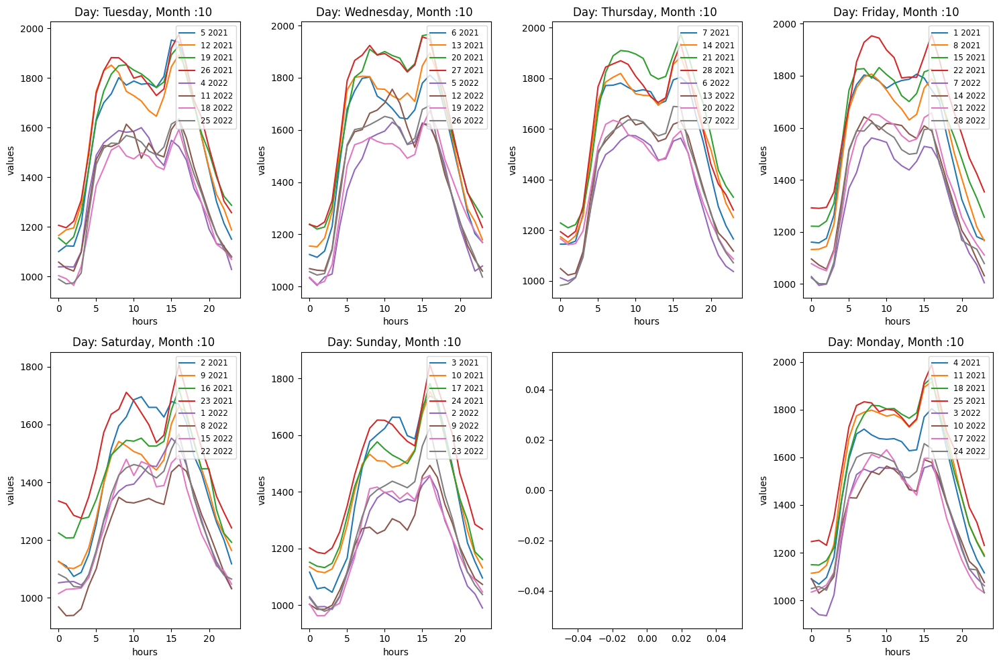

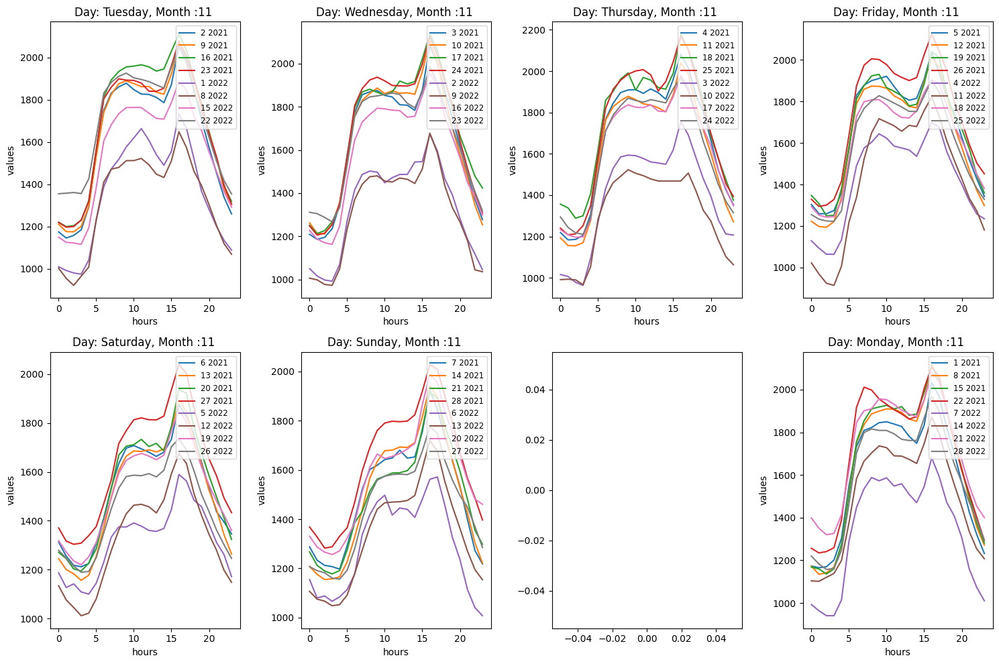

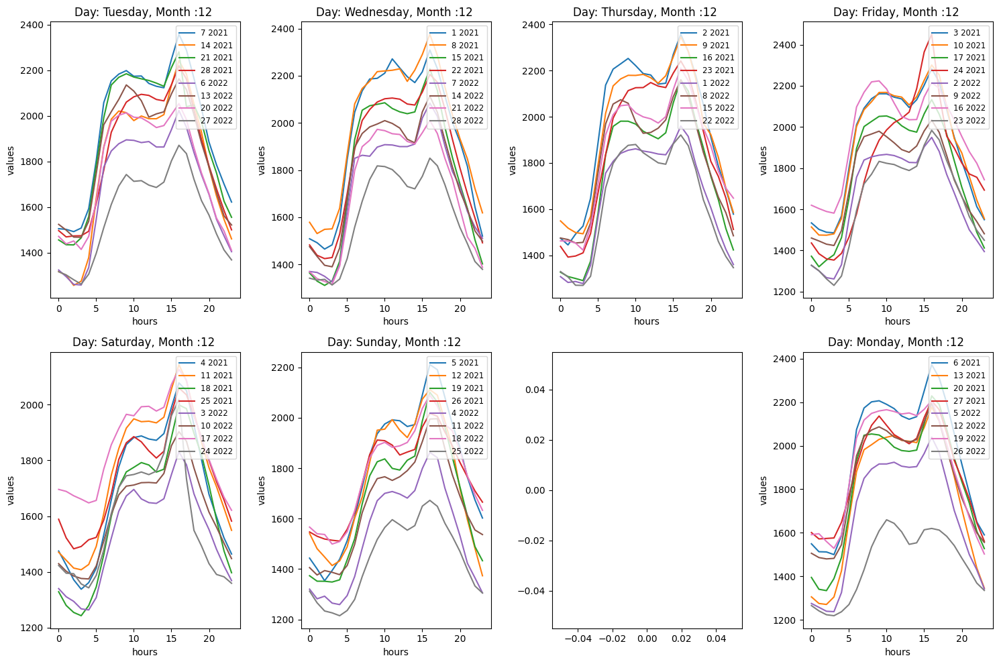

In [ ]:
df_2021 = allote_2021(df_2021)
df_2022 = allote_2022(df_2022)
df_2021.rename(columns={'TotalLoad': 'values'}, inplace=True)
df_2022.rename(columns={'TotalLoad': 'values'}, inplace=True)
make_graph(df_2022,df_2021,"DK2.pdf")

In [ ]:
# Finding the monthly average
DK1_mixed=pd.read_csv('DK1_mixed.csv')

DAILY_AVERAGE=pd.DataFrame(columns=['2023_values','Date','Month'])
for i in range (0,365):
  sum=0
  for j in range (0,24):
    sum=sum+DK1_mixed['2023_values'].iloc[i*24+j]
  DAILY_AVERAGE.loc[i]=({'2023_values':sum/24,'Date': DK1_mixed['date'].iloc[i*24],'Month': DK1_mixed['month'].iloc[i*24]})
print(DAILY_AVERAGE)

     2023_values  Date  Month
0    2195.606250     1      1
1    2499.656250     2      1
2    2609.627083     3      1
3    2862.788750     4      1
4    2782.897083     5      1
..           ...   ...    ...
360  2612.407083    27     12
361  2885.455833    28     12
362  2771.470833    29     12
363  2446.437083    30     12
364     0.000000    31     12

[365 rows x 3 columns]


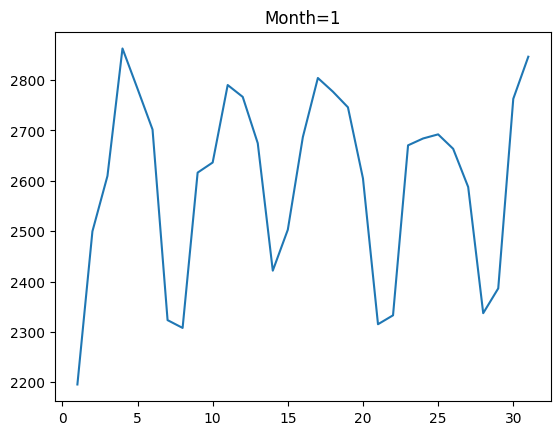

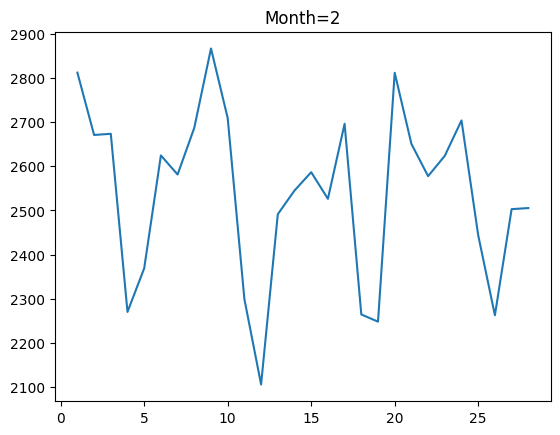

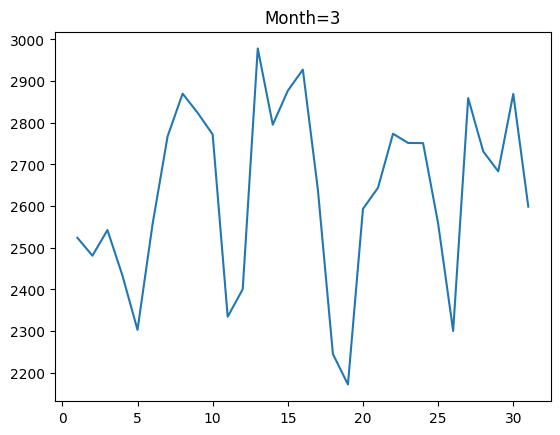

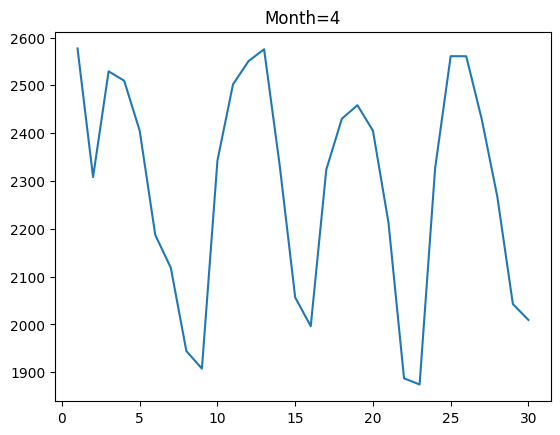

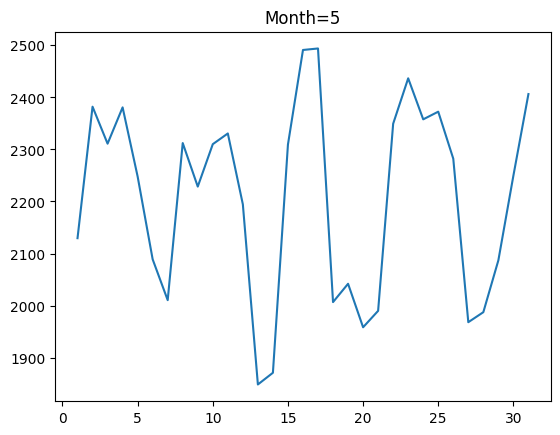

...

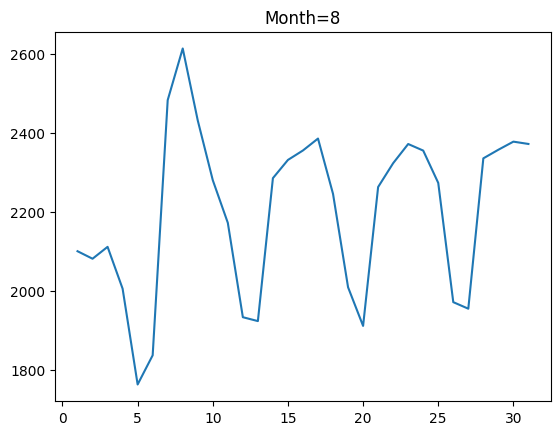

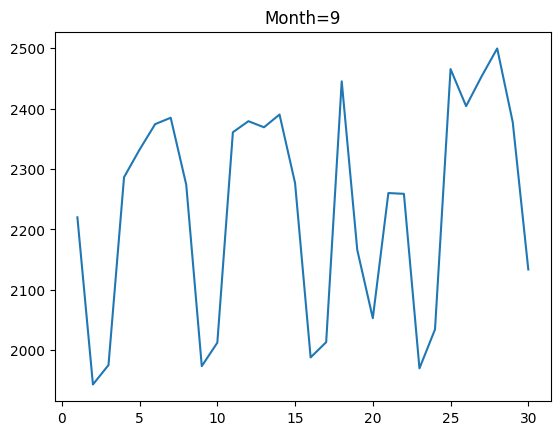

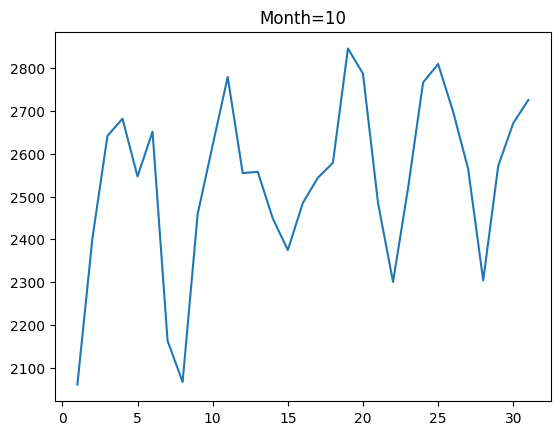

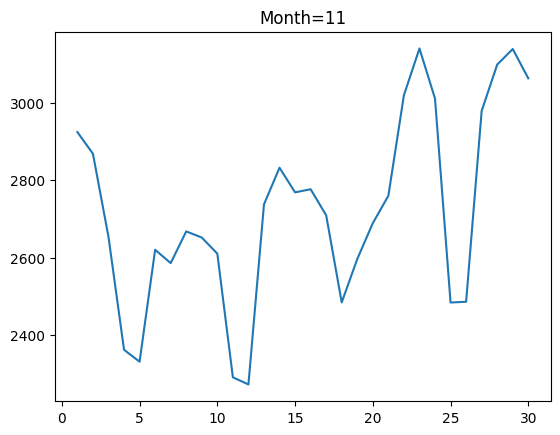

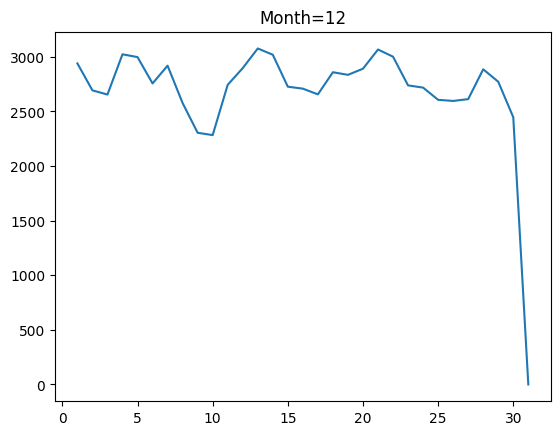

In [ ]:
import matplotlib.pyplot as plt
DAILY_AVERAGE['Month']=DAILY_AVERAGE['Month'].astype(int)
for i in range (1,13):
  plt.figure()
  monthly_data=DAILY_AVERAGE[DAILY_AVERAGE['Month']==i]
  x_label=monthly_data['Date']
  y_label=monthly_data['2023_values']
  plt.plot(x_label,y_label)
  plt.title(f'Month={i}')
  plt.savefig(f'Month={i}, DK1 plot')

In [ ]:
DK2_mixed=pd.read_csv('DK2_mixed.csv')

DAILY_AVERAGE=pd.DataFrame(columns=['TotalLoad','Date','Month'])
for i in range (0,365):
  sum=0
  for j in range (0,24):
    sum=sum+DK2_mixed['2023_values'].iloc[i*24+j]
  DAILY_AVERAGE.loc[i]=({'TotalLoad':sum/24,'Date': DK2_mixed['date'].iloc[i*24],'Month': DK2_mixed['month'].iloc[i*24]})
print(DAILY_AVERAGE)

       TotalLoad  Date  Month
0    1342.845000     1      1
1    1557.162500     2      1
2    1607.701250     3      1
3    1672.438333     4      1
4    1704.237083     5      1
..           ...   ...    ...
360  1727.223333    27     12
361  1680.820833    28     12
362  1646.076250    29     12
363  1539.820833    30     12
364     0.000000    31     12

[365 rows x 3 columns]


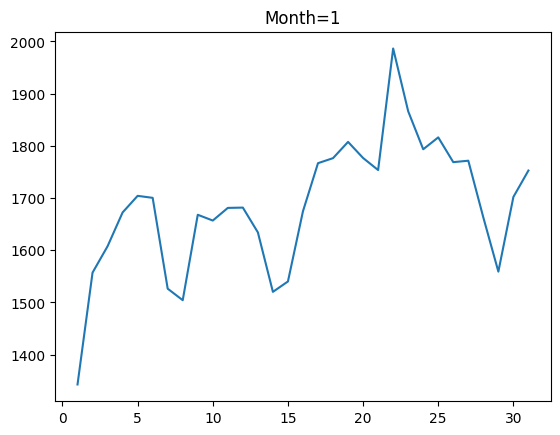

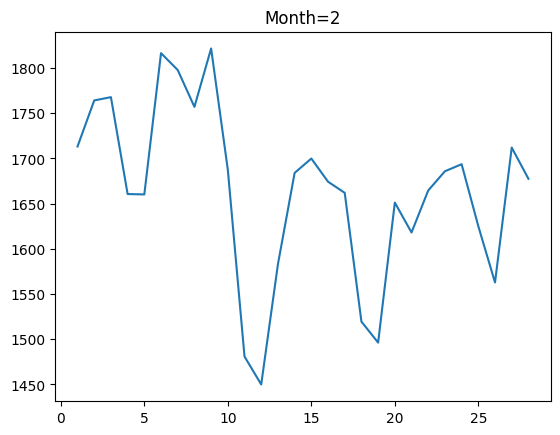

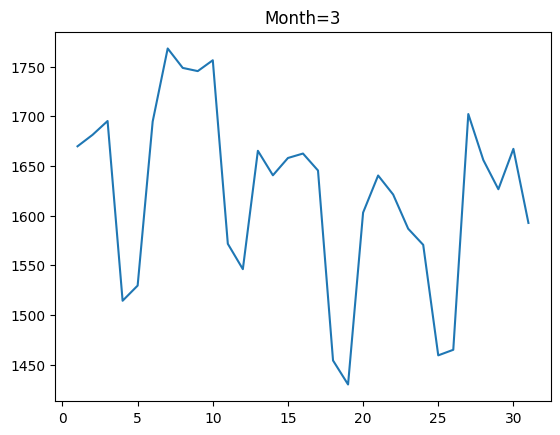

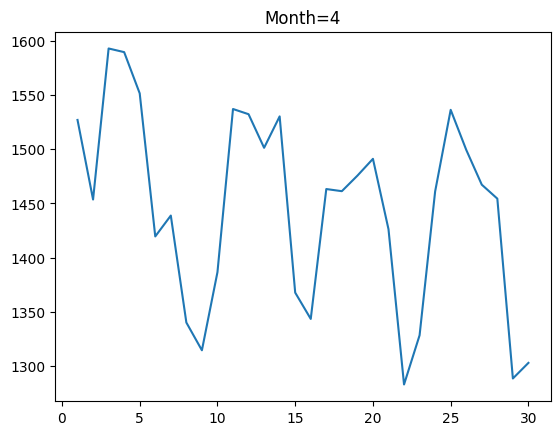

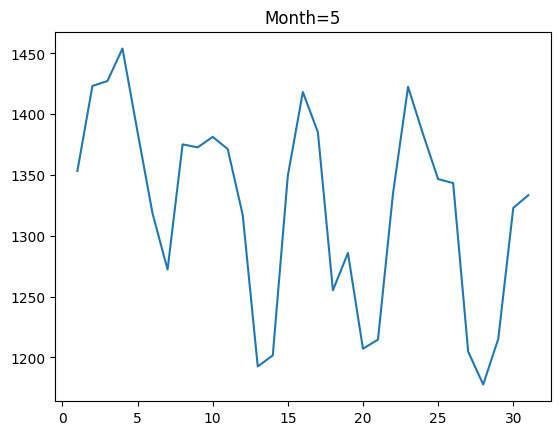

...

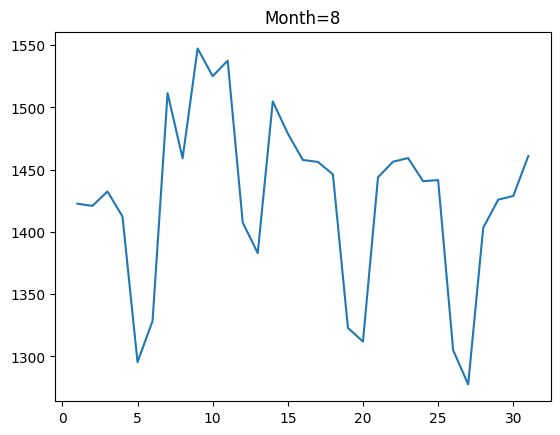

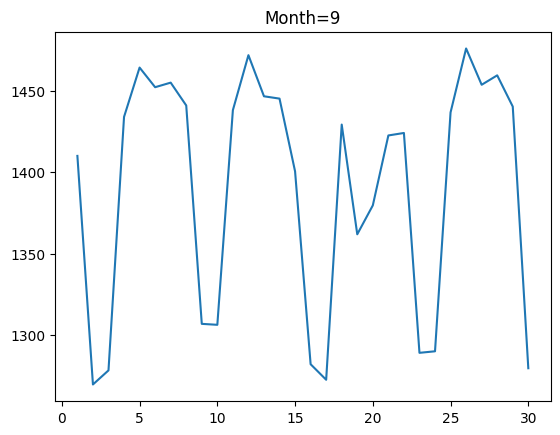

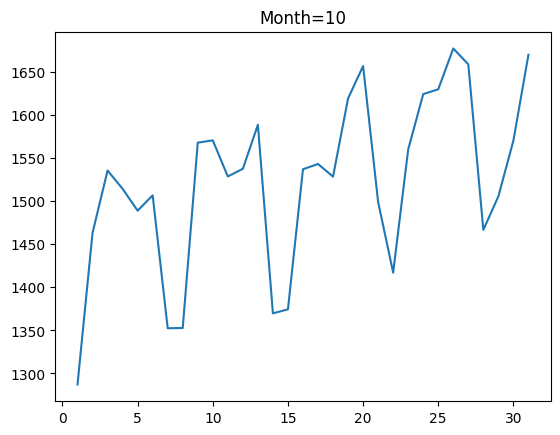

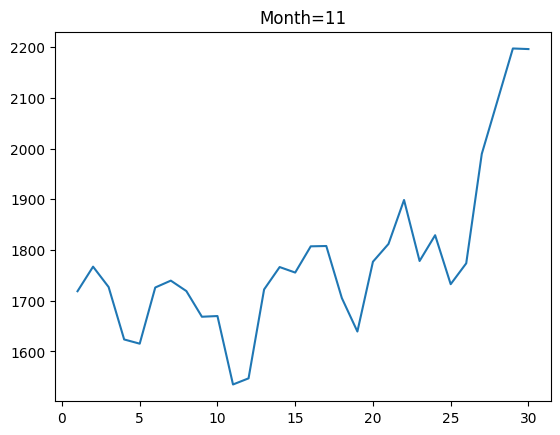

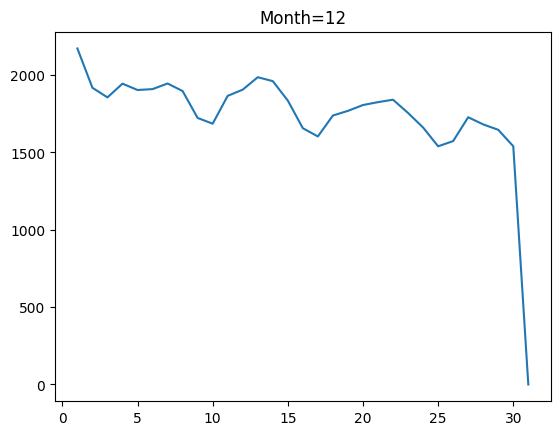

In [ ]:
import matplotlib.pyplot as plt
DAILY_AVERAGE['Month']=DAILY_AVERAGE['Month'].astype(int)
for i in range (1,13):
  plt.figure()
  monthly_data=DAILY_AVERAGE[DAILY_AVERAGE['Month']==i]
  x_label=monthly_data['Date']
  y_label=monthly_data['TotalLoad']
  plt.plot(x_label,y_label)
  plt.title(f'Month={i}')
  plt.savefig(f'Month={i}, DK2 plot')